# Conhecendo os dados

Para conhecer melhor os dados, serão realizadas análises exploratórias afim de identificar padrões de comportamentos e até realizar tratamentos necessários, como substituição de outliers, por exemplo.

## Sumário do notebook:
   1. Definição do ambiente
   2. Leitura dos dados
   3. Análise exploratória
   4. Preenchimento de dados faltantes
   5. Análise de correlação
   6. Simulação de retorno sobre o valor investido

------

## 1. Definição do ambiente

### Pacotes

In [ ]:
%%capture 

!pip install dash
!pip install jupyter-dash
!pip install cmasher
!pip install swifter

In [44]:
import datetime as dt
from dateutil.relativedelta import relativedelta
import pandas as pd
import numpy as np
import warnings
import swifter

import io, boto3, os

import cmasher as cmr
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import matplotlib as mp
from dash import Dash, dcc, html, Input, Output
from jupyter_dash import JupyterDash
import seaborn as sns
import matplotlib.pyplot as plt

from statsmodels.tsa.seasonal import DecomposeResult, seasonal_decompose

In [45]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 500) 
pd.set_option('display.min_rows', 500)
pd.set_option('display.expand_frame_repr', True)
warnings.simplefilter(action='ignore', category=FutureWarning)

### Variáveis globais

In [46]:
periodo = pd.to_datetime(['2017-06-01', '2022-11-17'])

In [47]:
cores_tema = {
   'verde_claro': '#8DD8D3',
   'verde_escuro': '#599191', 
   'azul_petroleo': '#0B6374',
   'cinza_escuro': '#424242',
   'azul_bic': '#27278B', 
    'azul':'#1b86b9',
   'laranja': '#C0791B',  
   'vermelho': '#FD5B58', 
   'rosa': '#D558AB',
   'amarelado': '#D7E6A3'
}

In [48]:
#@title parâmetros de formatação dos gráficos {display-mode: "form"}
plotly_kwargs = dict(
    title_x=0.5,
    autosize=False,
    plot_bgcolor='white',
    margin=dict(l=2, r=10, t=30, b=2),
    width=1000,
    height=500,
    hovermode='x unified',
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    )
)

### Funções úteis

In [49]:
def generate_trendline(df:pd.DataFrame, xvar:str, yvar:str, trendtype='ols', color='#1ABC9C', **fig_kwargs):
  import plotly.express as px

  correlation = df[xvar].corr(df[yvar])
  fig = px.scatter(df, x=xvar, y=yvar, trendline=trendtype)
  fig.update_traces(marker=dict(color=color, line=dict(width=1,
                                        color='#768787'),
                                opacity=0.6,))  
  fig.update_xaxes(title_text=f'Retorno {xvar} (%)')
  fig.update_yaxes(title_text=f'Retorno {yvar} (%)')
  fig.update_layout(title=f'<b>Retorno {xvar} x {yvar}</b><br>Correlação = {round(correlation,2)}', **fig_kwargs)
  results = px.get_trendline_results(fig)

  return fig, results.px_fit_results


def plot_seasonal_decompose(result:DecomposeResult, dates:pd.Series=None, title:str="Seasonal Decomposition"):

  colors = cmr.take_cmap_colors(cmr.sapphire, 4, cmap_range=(0.15, 0.85), return_fmt='hex')

  x_values = dates if dates is not None else np.arange(len(result.observed))
  return (
      make_subplots(
          rows=4,
          cols=1,
          subplot_titles=["Observado", "Tendência", "Variações sazonais", "Resíduos"],
      )
      .add_trace(
          go.Scatter(x=x_values, y=result.observed, mode="lines", name='Observed', line=dict(color=colors[0], width=3)),
          row=1,
          col=1,          
      )
      .add_trace(
          go.Scatter(x=x_values, y=result.trend, mode="lines", name='Trend', line=dict(color=colors[1], width=3)),
          row=2,
          col=1,          
      )
      .add_trace(
          go.Scatter(x=x_values, y=result.seasonal, mode="lines", name='Seasonal', line=dict(color=colors[2], width=3)),
          row=3,
          col=1,          
      )
      .add_trace(
          go.Scatter(x=x_values, y=result.resid, mode="lines", name='Residual', line=dict(color=colors[3], width=3)),
          row=4,
          col=1,          
      )
      .update_layout(
          width=800, height=900, title=f'<b>{title}</b>', margin={'t':100}, title_x=0.5, showlegend=False, autosize=False, plot_bgcolor='white',
      )
  )

---------

## 2. Leitura dos dados

Conforme explicado no script `1. Coleta de dados`, temos variáveis que representam vários índices e fatores relevantes às criptomoedas.

#### Importação

In [50]:
s3 = boto3.client('s3')

In [51]:
obj = s3.get_object(Bucket='projetointerdisciplinars2', Key='data/raw/df_btc_covars.csv')
df = pd.read_csv(io.BytesIO(obj['Body'].read()), index_col=0)

df.index.name = 'Date'

In [52]:
df.head(3)

,btc_high,btc_low,btc_open,btc_close,btc_volume,btc,usdt,eth,ndxt,sp500,usd,iot,hash_rate
Date,,,,,,,,,,,,,
2017-11-17,8004.589844,7561.089844,7853.569824,7708.990234,4651670016,7708.990234,1.00139,332.394012,4031.629883,2578.850098,3.2706,NaN,1.132691e+07
2017-11-18,7884.990234,7463.439941,7697.209961,7790.149902,3667190016,7790.149902,1.00231,347.612000,NaN,NaN,NaN,NaN,9.224307e+06
2017-11-19,8101.910156,7694.100098,7766.029785,8036.490234,3149319936,8036.490234,1.00244,354.385986,NaN,NaN,NaN,28.0,1.085213e+07


Conferindo se todas as colunas continuam numéricas:

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1827 entries, 2017-11-17 to 2022-11-17
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   btc_high    1827 non-null   float64
 1   btc_low     1827 non-null   float64
 2   btc_open    1827 non-null   float64
 3   btc_close   1827 non-null   float64
 4   btc_volume  1827 non-null   int64  
 5   btc         1827 non-null   float64
 6   usdt        1827 non-null   float64
 7   eth         1827 non-null   float64
 8   ndxt        1259 non-null   float64
 9   sp500       1259 non-null   float64
 10  usd         1304 non-null   float64
 11  iot         260 non-null    float64
 12  hash_rate   1827 non-null   float64
dtypes: float64(12), int64(1)
memory usage: 199.8+ KB


Conferindo se o index continua no formato correto de data:

In [54]:
df.index

Index(['2017-11-17', '2017-11-18', '2017-11-19', '2017-11-20', '2017-11-21',
       '2017-11-22', '2017-11-23', '2017-11-24', '2017-11-25', '2017-11-26',
       ...
       '2022-11-08', '2022-11-09', '2022-11-10', '2022-11-11', '2022-11-12',
       '2022-11-13', '2022-11-14', '2022-11-15', '2022-11-16', '2022-11-17'],
      dtype='object', name='Date', length=1827)

Corrigindo de objeto para tipo data.

In [55]:
df.index = pd.to_datetime(df.index)

---------

## 3. Análise exploratória

##### Informações gerais do dataframe

In [56]:
df.describe()

,btc_high,btc_low,btc_open,btc_close,btc_volume,btc,usdt,eth,ndxt,sp500,usd,iot,hash_rate
count,1827.000000,1827.000000,1827.000000,1827.000000,1.827000e+03,1827.000000,1827.000000,1827.000000,1259.000000,1259.000000,1304.000000,260.000000,1.827000e+03
mean,20760.603587,19665.947578,20246.906348,20249.268044,2.637458e+10,20249.268044,1.001593,1131.191765,6021.373109,3420.030182,4.612093,21.296154,1.116821e+08
std,17464.880867,16512.579105,17024.947416,17018.145277,1.993908e+10,17018.145277,0.005768,1203.425176,1748.625487,675.156441,0.796499,15.437781,6.609720e+07
min,3275.377930,3191.303467,3236.274658,3236.761719,2.923670e+09,3236.761719,0.966644,84.308296,3457.919922,2237.399902,3.145100,6.000000,8.342572e+06
25%,7900.539551,7511.864746,7688.712402,7684.071777,1.108360e+10,7684.071777,0.999983,208.977219,4393.555176,2821.954956,3.865350,11.000000,4.857148e+07
50%,11089.799805,10516.417969,10818.156250,10821.726562,2.410343e+10,10821.726562,1.000500,477.493988,5643.189941,3224.729980,4.927400,16.000000,1.096787e+08
75%,34778.076172,32265.797852,33767.375000,33734.515625,3.577598e+10,33734.515625,1.002497,1802.761414,7543.064941,4018.845093,5.321700,27.000000,1.573418e+08
max,68789.625000,66382.062500,67549.734375,67566.828125,3.509679e+11,67566.828125,1.077880,4812.087402,9855.419922,4796.560059,5.886400,100.000000,3.167823e+08


- As variáveis de `NDXT`, `SP500`, `USD` e `IOT` possuem dados faltantes, as demais possuem os dados completos.
- A variação de valor de fechamento ajustado da bitcoin entre mínimo e máximo é muito alta, indo de 3.200 a 67.600, mas não parece estar errado devido às outras variáveis relacionadas à bitcoin, que seguem o mesmo comportamento (preço de abertura, de fechamento, mínimo e máximo). Iremos entender melhor a tendência de crescimento ao visualizar a série ao longo do tempo.
- O USDT é uma moeda que varia pouco no histórico analisado, tendo comportamento provável mais _flat_.
- A ETH também demonstra variação mais relevante, porém de acordo com os quartis não aparenta ser crítico, talvez também seja devido á tendência.
- As demais moedas também não aparentam ter algo crítico a primeiro olhar, e é necesário olhar suas séries temporais para melhor análise.

### 3.1. Bitcoin

Nenhuma das linhas contém dados faltantes e todas as colunas de preços possuem estatísticas similares (média, desvio padrão, etc), como esperado, não evidenciando nenhum comportamento anormal ao primeiro contato.

##### Série histórica

In [57]:
df.head()

,btc_high,btc_low,btc_open,btc_close,btc_volume,btc,usdt,eth,ndxt,sp500,usd,iot,hash_rate
Date,,,,,,,,,,,,,
2017-11-17,8004.589844,7561.089844,7853.569824,7708.990234,4651670016,7708.990234,1.001390,332.394012,4031.629883,2578.850098,3.2706,NaN,1.132691e+07
2017-11-18,7884.990234,7463.439941,7697.209961,7790.149902,3667190016,7790.149902,1.002310,347.612000,NaN,NaN,NaN,NaN,9.224307e+06
2017-11-19,8101.910156,7694.100098,7766.029785,8036.490234,3149319936,8036.490234,1.002440,354.385986,NaN,NaN,NaN,28.0,1.085213e+07
2017-11-20,8336.860352,7949.359863,8039.069824,8200.639648,3488450048,8200.639648,1.001920,366.730011,4044.050049,2582.139893,3.2545,NaN,1.186951e+07
2017-11-21,8348.660156,7762.709961,8205.740234,8071.259766,4277609984,8071.259766,0.996047,360.401001,4076.659912,2599.030029,3.2540,NaN,1.173386e+07


In [58]:
columns_btc = df.columns[df.columns.str.contains('btc')]

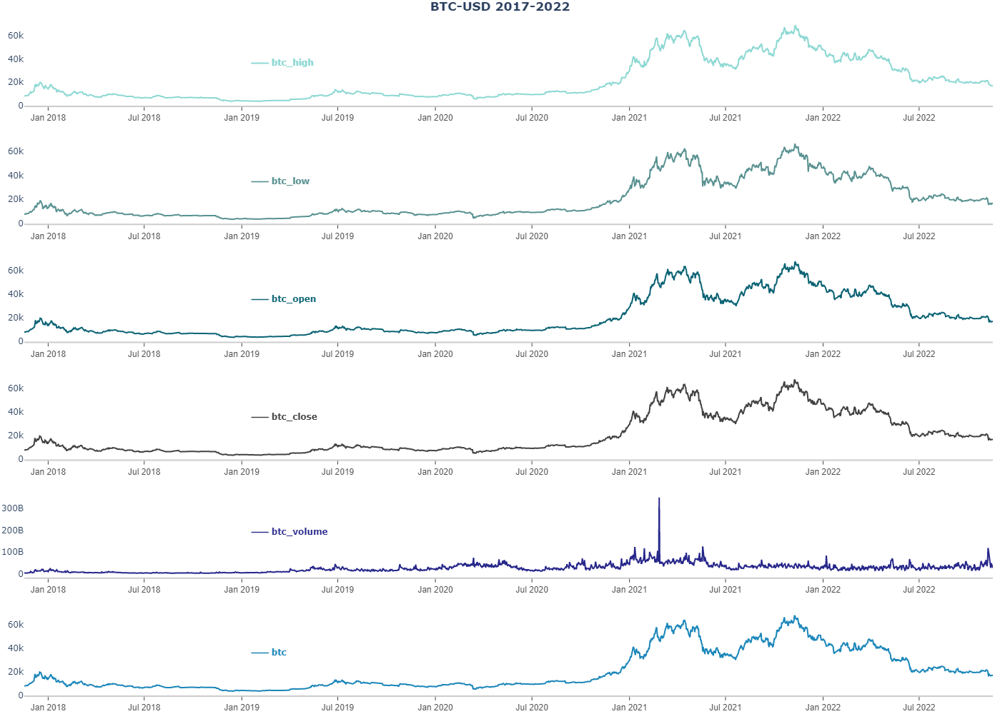

In [59]:
fig = make_subplots(rows=len(columns_btc), cols=1, shared_xaxes=True)
colors = list(cores_tema.values())

for i, col in enumerate(columns_btc, start=1):
    fig.add_trace(go.Scatter(x=df.index, y=df[col], line=dict(color=colors[i-1], width=2), name=col), row=i, col=1)
    fig.update_xaxes(**plotly_kwargs['xaxis'], row=i, col=1)
    fig.add_annotation(
            x = '2019', y = -0.15
          , xref='paper', yref='paper' 
          , xanchor='left', yanchor='middle'
          , xshift=10, yshift=60
          ,text=f'<b>━━ {col}<b>', showarrow=False, row=i, col=1, 
          font={'color': colors[i-1], 'size':12}, align='center')

fig.update_layout(title='<b>BTC-USD 2017-2022</b>', **plotly_kwargs)
fig.update_layout(width=800, height=1000, showlegend=False)
fig

Todas as séries de preço (todas as colunas exceto a de volume) possuem o mesmo comportamento, o que é esperado dado que são as oscilações no mesmo dia. 

Há uma tendência de crescimento muito forte no fim de 2020, com a notícia sobre a utilização do bitcoin como meio de pagamento, com uma interrupção nesse crescimento em abril/21, com a notícia dada por Elon Musk sobre a recuada da Tesla em receber pagamentos via Bitcoin, com o argumento do alto consumo de enegia de combustíveis fósseis, além de ameaças feitas pela China sobre a restrição do país desde mineradores a investidores. O mercado reagiu no fim de julho, com a réplica sobre a utilização de 75% da energia renovável por mineradores, mas ainda assim não voltou à desejada tendência de crescimento da moeda e, desde o fim de 2021, foi declarado o "inverno cripto".

Parte da explicação do inverno cripto está na alta dos juros nos EUA, que trouxe certa queda em todo o mercado financeiro, o que é possível perceber mais a frente observando S&P500 e até o IBOVESPA (não contemplado nessa análise). Apesar disso, a maior parte da justificativa está no fato da moeda "não produzir nada". 

A ideia da bitcoin era surgir como um substituto do que atualmente consideramos como dinheiro, mas devido à discussões de regulamentação, além de outros impecílios sendo impostos, houve recuada de investidores na moeda.

Para entender o comportamento da variação entre o preço mínimo, máximo e a data de fechamento ajustada em cada dia, o gráfico abaixo ilustra esse intervalo:

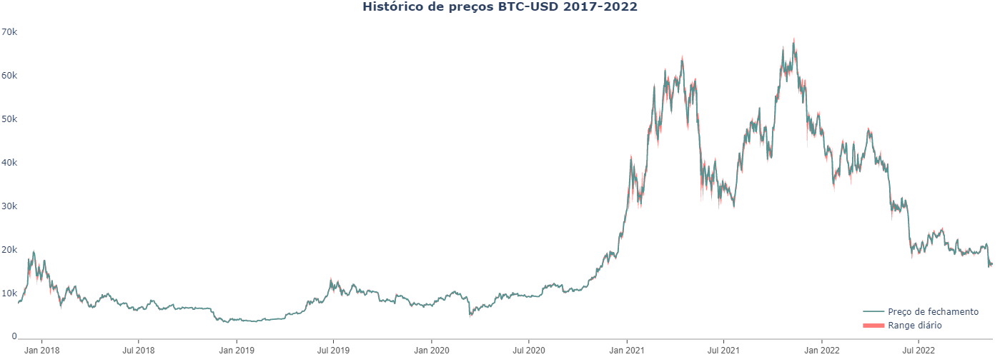

In [60]:
fig = go.Figure()

fig.add_traces([
    go.Scatter(x = df.index, y = df['btc_high'], name='Máxima',
               mode = 'lines', line_color = 'rgba(0,0,0,0)', 
               showlegend = False),
    go.Scatter(x = df.index, y = df['btc_low'],
               mode = 'lines', line_color = 'rgba(0,0,0,0)', name = 'Range diário',
               fill='tonexty', fillcolor = 'rgba'+str((*mp.colors.to_rgb(cores_tema['vermelho']) , 0.8))),
    go.Scatter(x=df.index, y=df['btc'], name='Preço de fechamento', 
               line=dict(color=cores_tema['verde_escuro'], width=1.8)),
])

fig.update_traces(mode='lines')
fig.update_layout(title='<b>Histórico de preços BTC-USD 2017-2022</b>', **plotly_kwargs)

fig.update_layout(legend=dict(
    yanchor="bottom",
    y=0.01,
    xanchor="right",
    x=0.99
))
fig.show()

Analisando a série de volume ao longo do tempo e comparando com a de preço do bitcoin, para verificar um possível impacto na subida ou na queda de preços, temos:

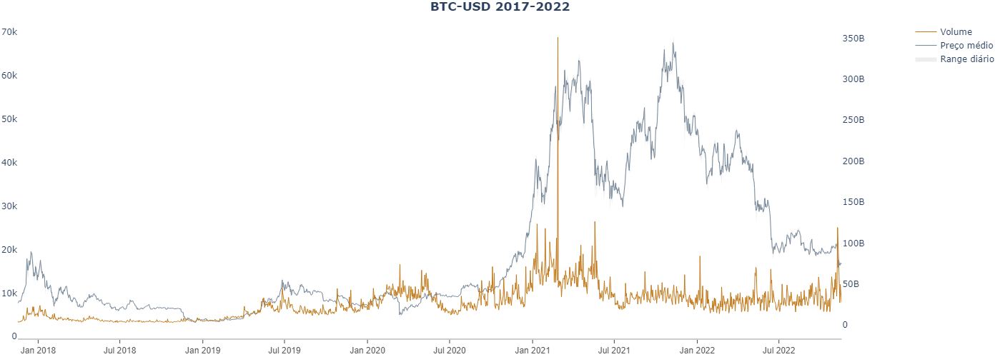

In [61]:
# fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_traces([
    go.Scatter(x = df.index, y = df['btc_high'], name='Máxima',
               mode = 'lines', line_color = 'rgba(0,0,0,0)', 
               showlegend = False),
    go.Scatter(x = df.index, y = df['btc_low'],
               mode = 'lines', line_color = 'rgba(0,0,0,0)', name = 'Range diário',
               fill='tonexty', fillcolor = 'rgba'+str((*mp.colors.to_rgb('lightgrey') , 0.4))),
    go.Scatter(x=df.index, y=df['btc'], name='Preço médio', 
               line=dict(color='lightslategrey', width=1)),
])

fig.add_trace(
    go.Scatter(x=df.index, y=df['btc_volume'], name="Volume",
              line=dict(color=cores_tema['laranja'], width=1)),secondary_y=True,
)

fig.update_traces(mode='lines')
fig.update_layout(title='<b>BTC-USD 2017-2022</b>', **plotly_kwargs)

fig.show()

Como Fev/21 parece ser um outlier, vamos realizar a mesma análise sem este ponto, para observar o comportamento das séries.

In [62]:
btc_vol2602 = df.loc[df.index != '2021-02-26']

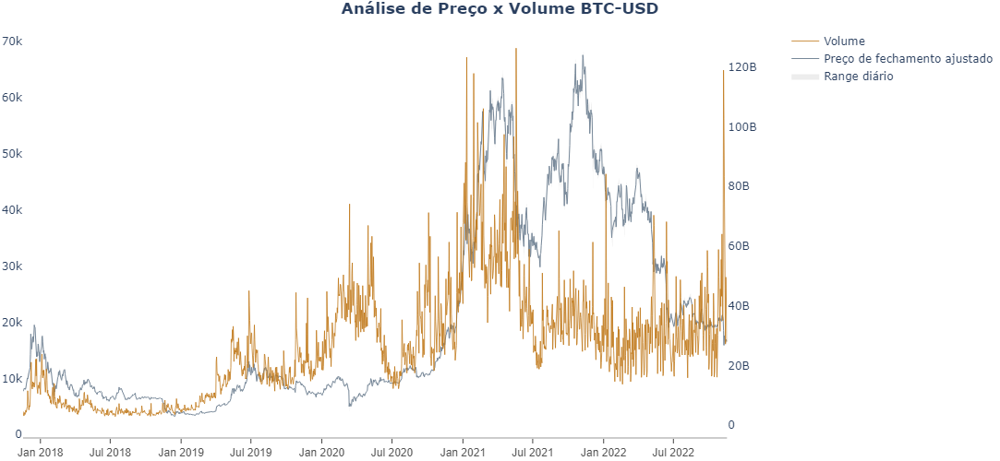

In [63]:
# fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_traces([
    go.Scatter(x = df.index, y = df['btc_high'], name='Máxima',
               mode = 'lines', line_color = 'rgba(0,0,0,0)', 
               showlegend = False),
    go.Scatter(x = df.index, y = df['btc_low'],
               mode = 'lines', line_color = 'rgba(0,0,0,0)', name = 'Range diário',
               fill='tonexty', fillcolor = 'rgba'+str((*mp.colors.to_rgb('lightgrey') , 0.4))),
    go.Scatter(x=df.index, y=df['btc'], name='Preço de fechamento ajustado', 
               line=dict(color='lightslategrey', width=1)),
])

fig.add_trace(
    go.Scatter(x=btc_vol2602.index, y=btc_vol2602['btc_volume'], name="Volume",
              line=dict(color=cores_tema['laranja'], width=0.8)),secondary_y=True,
)

fig.update_traces(mode='lines')
fig.update_layout(title='<b>Análise de Preço x Volume BTC-USD</b>', **plotly_kwargs)

fig.show()

Agora é possível observar uma correlação maior, apesar de grandes variações da série de volume, e outros possíveis outliers em jan/21, mai/21 e nov/22  que pode acontecer devido à situações de mercado, mas que, para melhor visualização o ideal é suavizar a série.

In [64]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

model_vol = SimpleExpSmoothing(np.asarray(btc_vol2602['btc_volume']))
model_vol._index = pd.to_datetime(btc_vol2602.index)

fit_vol = model_vol.fit(smoothing_level=.3)

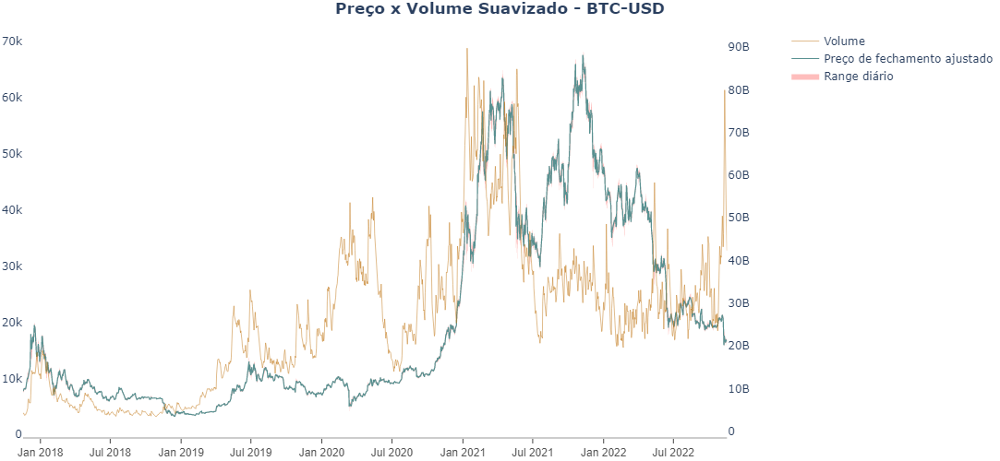

In [65]:
# fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_traces([
    go.Scatter(x = df.index, y = df['btc_high'], name='Máxima',
               mode = 'lines', line_color = 'rgba(0,0,0,0)', 
               showlegend = False),
    go.Scatter(x = df.index, y = df['btc_low'],
               mode = 'lines', line_color = 'rgba(0,0,0,0)', name = 'Range diário',
               fill='tonexty', fillcolor = 'rgba'+str((*mp.colors.to_rgb(cores_tema['vermelho']) , 0.4))),
    go.Scatter(x=df.index, y=df['btc'], name='Preço de fechamento ajustado', 
               line=dict(color=cores_tema['verde_escuro'], width=1.2)),
])

fig.add_trace(
    go.Scatter(x=btc_vol2602.index, y=fit_vol.fittedvalues, name="Volume",
              line=dict(color=cores_tema['laranja'], width=0.5)),secondary_y=True,
)

fig.update_traces(mode='lines')
fig.update_layout(title='<b>Preço x Volume Suavizado - BTC-USD</b>', **plotly_kwargs)

fig.show()

Com a série de volume suavizada, é possível observar certa correlação entre preço e volume. Antes de 2021 a correlação é mais clara, após esse ano a estrutura da série muda.

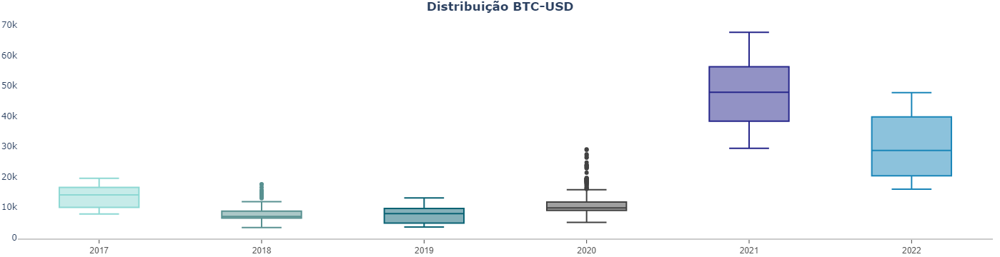

In [66]:
data = [go.Box(y=df.loc[str(x)]['btc'], 
               name=x, line=dict(color=list(cores_tema.values())[i], width=2)) 
        for i,x in enumerate(range(periodo[0].year,periodo[1].year+1))]

fig = go.Figure(data=data)
fig.update_layout(title='<b>Distribuição BTC-USD</b>', **plotly_kwargs)
fig.update_layout(width=500, height=300, showlegend=False)
fig.show()

Agora, ao observar o comportamento anual dos preços, observamos que o ano de 2020 teve muitos outliers, provavelmente devido á pandemia e mudanças de mercado, enquanto o ano de 2021 tem alta variação, apesar de ter sido o melhor ano da moeda e, mesmo seu preço mínimo, ainda foi superior há quase todos os pontos de preço de 2020. O ano de 2022 tem queda com relação ao de 2021, mas ainda está acima do patamar dos anos anteriores.

In [67]:
c= ['grey']*4 + [cores_tema['verde_claro']] + ['grey']

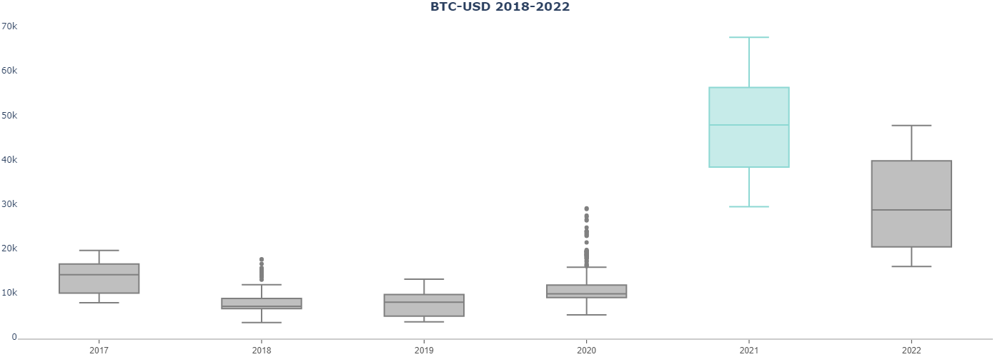

In [68]:
data = [go.Box(y=df.loc[str(x)]['btc'], 
               name=x, line=dict(color=c[i], width=2)) 
        for i,x in enumerate(range(periodo[0].year,periodo[1].year+1))]
fig = go.Figure(data=data)
fig.update_layout(title='<b>BTC-USD 2018-2022</b>', **plotly_kwargs)
fig.update_layout(width=800, height=500, showlegend=False)
fig.show()

Na distribuição anual dos volumes, observamos tendência suave de crescimento até 2021, tendo uma queda em 2022.

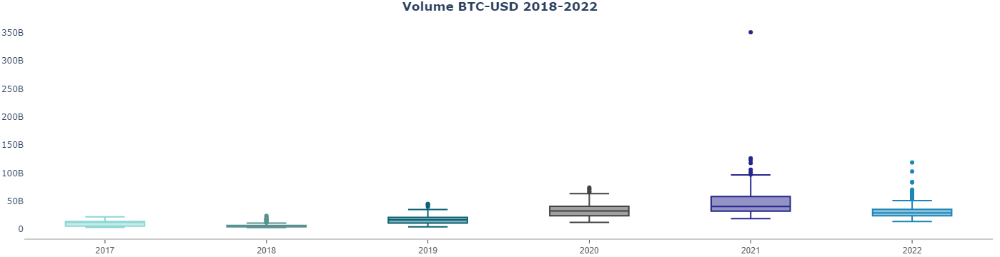

In [69]:
data = [go.Box(y=df.loc[str(x)]['btc_volume'], 
               name=x, line=dict(color=list(cores_tema.values())[i], width=2)) 
        for i,x in enumerate(range(periodo[0].year,periodo[1].year+1))]
fig = go.Figure(data=data)
fig.update_layout(title='<b>Volume BTC-USD 2018-2022</b>', **plotly_kwargs)
fig.update_layout(width=500, height=300, showlegend=False)
fig.show()

Como esperado, na base original de volumes há pontos candidatos à outliers que devem ser removidos para futuras análises.

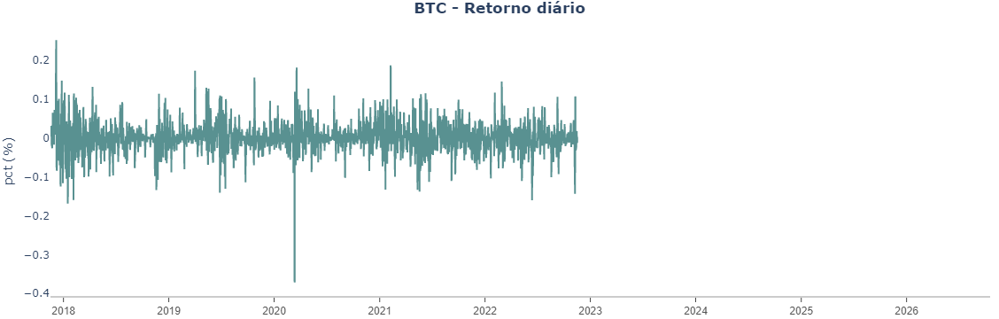

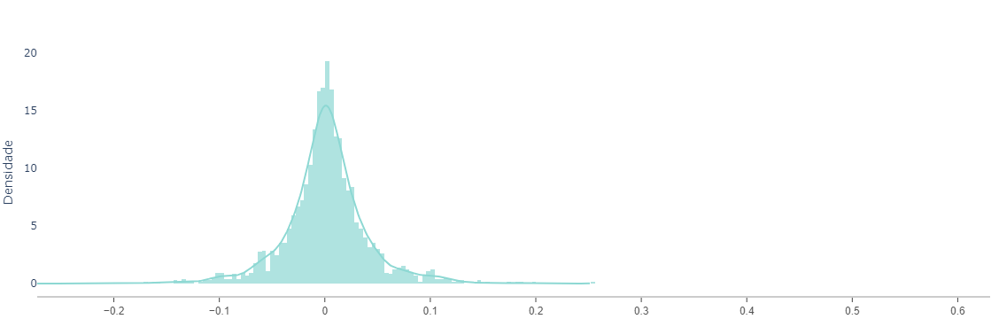

In [70]:
x_distplot = [df['btc'].pct_change().dropna()]

fig = go.Figure(data=go.Scatter(     
        x=df.index,
        y=df['btc'].pct_change(),
        name='Retorno',
        line=dict(color=cores_tema['verde_escuro'])      
))
fig.update_yaxes(title_text='pct (%)')
fig.update_layout(title='<b>BTC - Retorno diário</b>', **plotly_kwargs)
fig.update_layout(width=800, height=300, showlegend=False)
fig.show()

fig2 = ff.create_distplot(x_distplot, ['Bitcoin'], colors=[cores_tema['verde_claro']]+[cores_tema['vermelho']], bin_size=.004, show_rug=False)    
fig2.update_yaxes(title_text='Densidade')
fig2.update_layout(**plotly_kwargs)
fig2.layout.margin.update({'t':55})
fig2.update_layout(width=800, height=300, showlegend=False)
fig2.show()

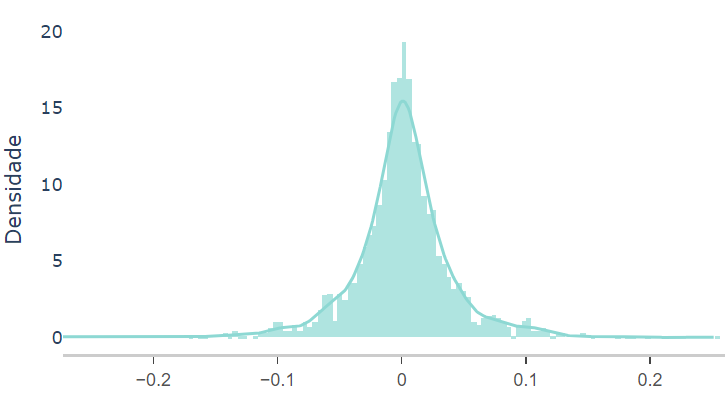O retorno diário demonstra variação coerente entre os dias, com a faixa de variação absoluta entre 0 e 20%, ou seja, variando até 20% positivamente ou negativamente, e com um outlier detectado em março/2020, início da pandemia. Apesar da faixa de variação ser até 20%, pelo gráfico de densidade é possível identificar que a maioria dos retornos varia absolutamente em até 10%.

##### Análise de diferentes períodos

Outra análise relevante sobre o comportamento da série de preços é através do agrupamento em diferentes períodos, para que possa ser observado algum tipo de sazonalidade ou tendência. Nesse caso, como medida de sumarização, escoolhemos a média.

In [71]:
weekly_mean = df.resample('W').mean()
monthly_mean = df.resample('M').mean()
quarter_mean = df.resample('Q').mean()

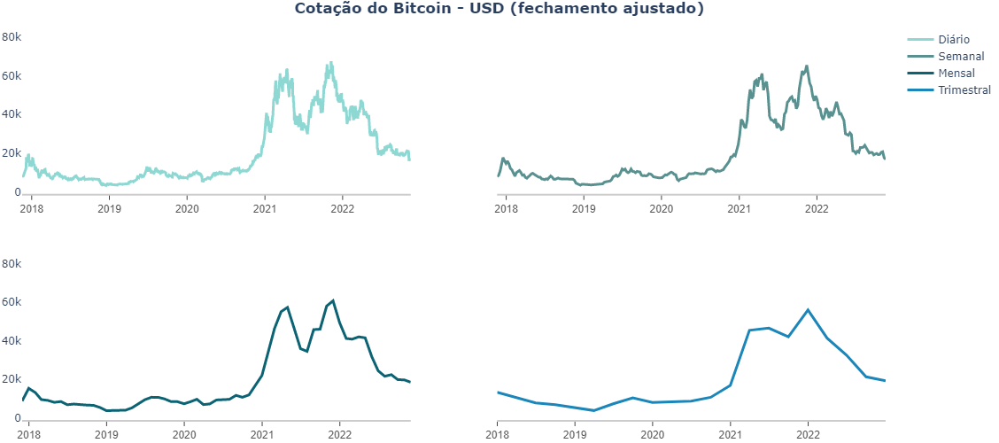

In [72]:
#@title Análise do preço médio de fechamento a partir da reamostragem da Série Temporal {display-mode: "form"}

# colors = cmr.take_cmap_colors(cmr.rainforest, 4, cmap_range=(0.15, 0.85), return_fmt='hex')

fig = make_subplots(rows=2, cols=2, shared_yaxes='all')

fig.add_trace(  go.Scatter(x=df.index, y=df['btc'], line=dict(color=cores_tema['verde_claro'], width=3), name='Diário'), row=1, col=1)
fig.add_trace(  go.Scatter(x=weekly_mean.index, y=weekly_mean['btc'], line=dict(color=cores_tema['verde_escuro'], width=3), name='Semanal'), row=1, col=2)
fig.add_trace(  go.Scatter(x=monthly_mean.index, y=monthly_mean['btc'], line=dict(color=cores_tema['azul_petroleo'], width=3), name='Mensal'), row=2, col=1)
fig.add_trace(  go.Scatter(x=quarter_mean.index, y=quarter_mean['btc'], line=dict(color=cores_tema['azul'], width=3), name='Trimestral', mode='lines'), row=2, col=2)

fig.update_xaxes(**plotly_kwargs['xaxis'], row=1, col=2)
fig.update_xaxes(**plotly_kwargs['xaxis'], row=2, col=1)
fig.update_xaxes(**plotly_kwargs['xaxis'], row=2, col=2)
fig.update_layout(xaxis_range=[df.index[0].to_pydatetime(),
                               df.index[-1].to_pydatetime()])

fig.update_layout(title='<b>Cotação do Bitcoin - USD (fechamento ajustado)</b>', **plotly_kwargs)
fig.add_annotation(x='2017', y=80000, yref="y", xref="x", text=f'Range 52 semanas: {min(df["btc_close"].iloc[-52*7:]):,.2f} - {max(df["btc_close"].iloc[-52*7:]):,.2f}', bgcolor="#bfdbcf", showarrow=False, borderpad=4)
fig.show()

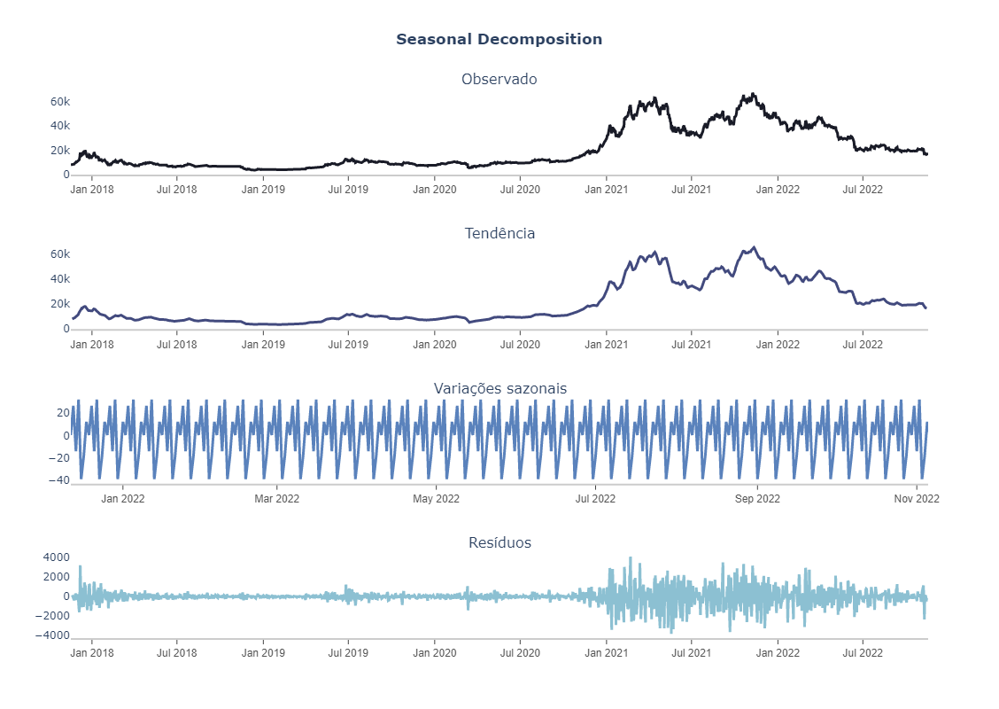

In [73]:
#@title Decomposição da Série Temporal do Preço de Fechamento {display-mode: "form"}

decomposition = seasonal_decompose(df[['btc']])
fig = plot_seasonal_decompose(decomposition, dates=df.index)
axes_x = [fig.layout[e] for e in fig.layout if e[0:5] == 'xaxis']
for i in range(1, len(axes_x)+1):
    fig.update_xaxes(**plotly_kwargs['xaxis'], row=i, col=1)
    
fig.update_layout(height=800, width = 1100)

fig.show()

Não existe sazonalidade ou tendência claras frequentes de acordo com os períodos avaliados. Há certo crescimento em um período específico, que pode ser mapeado com flags.

In [74]:
df_22 = df.loc['2022':].copy()

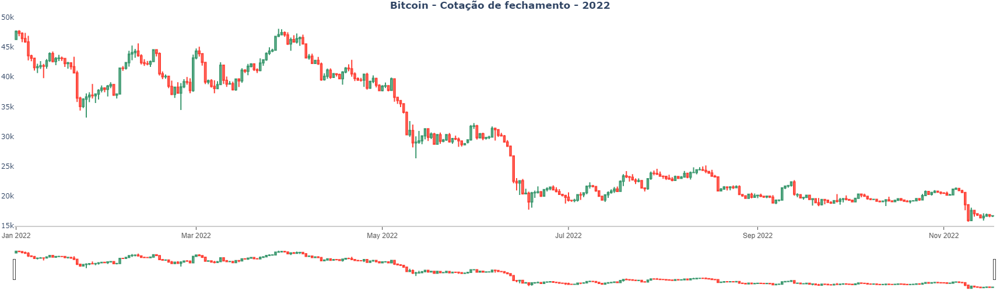

In [75]:
hovertext=[]
for i in range(len(df_22['btc_open'])):
    hovertext.append('Open: '+str(df_22['btc_open'][i])+'<br>Close: '+str(df_22['btc_close'][i]))

fig = go.Figure(data=go.Candlestick(
    x=df_22.index,
    open=df_22['btc_open'],
    high=df_22['btc_high'],
    low=df_22['btc_low'],
    close=df_22['btc'],
    text=hovertext,
    hoverinfo='text'
    )
)
fig.update_layout(title='<b>Bitcoin - Cotação de fechamento - 2022</b>', **plotly_kwargs)
fig.update_layout(yaxis_range=[15000, 50000])
# fig.add_vrect(x0="2022-02-24", x1=df_recorte.index[-1].strftime('%Y-%m-%d'), 
#               annotation_text="Início da guerra<br>na Ucrânia", annotation_position="top left",  
#               annotation_font_size=11,
#               annotation_font_color="Red",
#               fillcolor="yellow", opacity=0.25, line_width=0)
fig.show()

### 3.2. Cruzamento com as demais variáveis

#### **3.2.1. Gráficos das séries x BTC**

In [76]:
variaveis = [x for x in df.columns if not 'btc' in x]

In [77]:
app = JupyterDash('Correlações')
# app = Dash('Correlações')

app.layout = html.Div([
    html.H4("Análise do histórico de variáveis x Bitcoin"),
    
    html.Div(className='row',children=[
        html.Label(['Variáveis:'], style={'font-weight': 'bold', "text-align": "center"}),
        html.Div(children= dcc.Dropdown(
            id='y-axis', 
            options=variaveis,
            value='usd', 
            searchable=False,
            clearable=True
        ), style=dict(width='15%'))], style=dict(display='flex')),
    dcc.Graph(id="graph"),
])

@app.callback(
    Output("graph", "figure"), 
    Input("y-axis", "value"))

def generate_chart(y):
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(go.Scatter(x=df.index, y=df['btc'], name='BTC', 
                             line=dict(color=cores_tema['verde_escuro'], width=1.2)))
    
    fig.add_trace(go.Scatter(x=df.index, y=df[y], name=y,
                             line=dict(color=cores_tema['amarelado'], width=1.2)),secondary_y=True)

    fig.update_traces(mode='lines')
    fig.update_layout(title='<b>Comparação BTC e covariáveis 2017-2022</b>', **plotly_kwargs)

    return fig

# app.css.config.serve_locally = True
app.run_server(host='0.0.0.0', port=8050, debug=False)
# app.run_server(mode='jupyterlab', host='localhost', port=8080, debug=False)
# app.run_server(mode="inline", host='localhost', port=8080, debug=False)
# app.run_server(mode='jupyterlab', host='0.0.0.0', port=8050, debug=False)

 * Running on all addresses.
 * Running on http://172.16.186.247:8050/ (Press CTRL+C to quit)
127.0.0.1 - - [19/Nov/2022 21:07:04] "GET /_alive_c7857460-a07c-46dd-a782-ba44c25f638e HTTP/1.1" 200 -


Dash app running on http://0.0.0.0:8050/


Pelo gráfico é possível observar que a variável `ETH` realmente sofre comportamento muito similar com a `BTC`, como já observado acima. As variáveis  `NDXT`, `SP500`, `USD` e `HashRate` também parecem ter certa correlação, não tão forte, com a `BTC`. 

Mesmo com os dados faltantes nas séries, o comportamento entre as variáveis com a resposta segue fazendo sentido, e, como estamos trabalhando com séries temporais, a escolha será preencher esses dados faltantes e não remover, pois eles são dependentes uns dos outros. Além disso, a escolha será preencher via média móvel para que não haja risco de utilizar informação futura desconhecida na previsão da bitcoin quando realizarmos a modelagem.

Foi escolhida a média móvel de 3 dias para que haja maior peso aos dias mais próximos ao faltante.------------

## 4. Preenchimento de dados faltantes

Foi escolhida a média móvel de 3 dias para que haja maior peso aos dias mais próximos ao faltante. Além disso, foi realizado o _backward fill_ para preenchimento das primeiras datas sem informação.

In [78]:
df = (df
    .fillna(df.rolling(3,min_periods=1).mean())
    .bfill(axis=0)
    .ffill(axis=0))

Salvando no interim

In [79]:
import os, io, boto3

In [80]:
s3_resource = boto3.Session().resource('s3')

def upload_s3_csv(bucket, folder, filename, dataframe):
    csv_buffer = io.StringIO()
    dataframe.to_csv(csv_buffer, header=True, index=True)
    s3_resource.Bucket(bucket).Object(os.path.join(folder, filename)).put(Body=csv_buffer.getvalue())

In [81]:
upload_s3_csv(bucket = 'projetointerdisciplinars2'
              , folder = 'data/interim'
              , filename = 'df_btc_covars.csv'
              , dataframe = df
              , )

-----------

## 5. Análise de correlação

### 5.1. Correlação com a resposta no tempo x

In [82]:
cols_cov = df.columns[~df.columns.str.contains('btc_')]
df_cov = df[cols_cov]

In [83]:
df_corr = df_cov.corr()

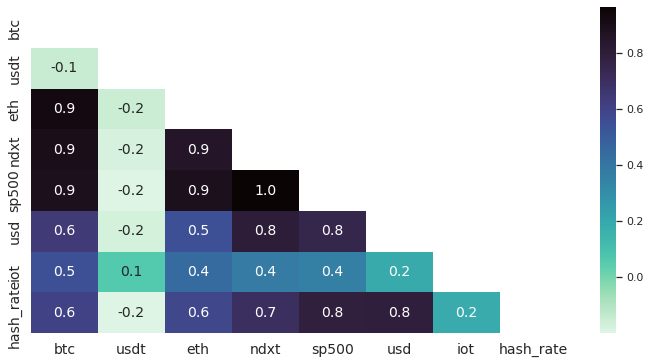

In [84]:
sns.set(rc={'figure.figsize':(12,6)})
sns.set_theme(style="whitegrid", rc={"axes.facecolor": (0, 0, 0, 0)})

mask = np.triu(np.ones_like(df_corr, dtype=bool))

fig = sns.heatmap(df_corr, annot=True, fmt='.1f', cmap='mako_r', mask=mask, annot_kws={'fontdict':{'fontsize':14}})
fig.set_ylabel("",fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=14)

plt.show(fig)

A única variável que não influencia fortemente a `btc` é o `usdt`. As variáveis de `hash_rate`, `usdt` e `iot` possuem correlação mais fraca (<70%), mas ainda assim, talvez relevante para explicar o comportamento da bitcoin. 

Como `hash_rate` e `usd` possuem +80% de correlação com `sp500`, que possui por sua vez correlação mais alta com a `btc`, vamos optar por remover ambas e manter a `sp500`.

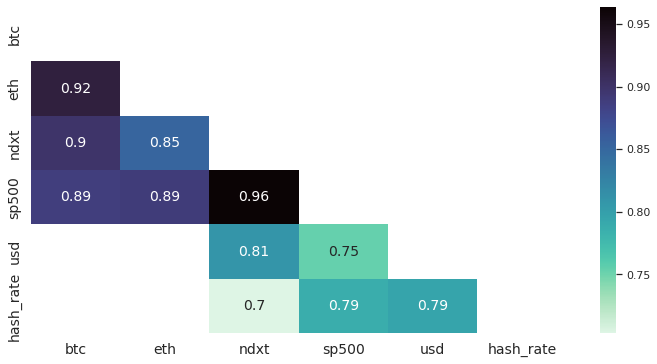

In [85]:
# filtrando as correlações maiores que +0.6 e menores que -0.6
corr_forte = df_corr[(df_corr > 0.65) | (df_corr < -0.65)]

# substituindo os valores das autocorrelações
corr_forte.replace(1,np.nan, inplace=True)

# retiando as linhas e colunas sem alta correlação
corr_forte.dropna(how='all', inplace=True, axis=1)
corr_forte.dropna(how='all', inplace=True)

plt.tick_params(axis='both', which='major', labelsize=14)

if len(corr_forte) :
  mask = np.triu(np.ones_like(corr_forte, dtype=bool))
  plt.show(sns.heatmap(corr_forte, annot=True, cmap='mako_r', mask=mask, annot_kws={'fontdict':{'fontsize':14}}));
else:
  print('Não há correlações significativas no conjunto de dados.')

Também devemos nos atentara ao uso da `eth` como covariável, por sua correlação com outras covariáveis e assim, podendo gerar multicolinearidade. Escolhi  `sp500` como covariável pois, além de ter alta correlação com `btc` também tem alta correlação com as demais.

### 5.2. Correlação com a resposta em lag

Como queremos prever a `btc` em detrimento às informações do presente, não teremos a previsão das covariáveis para utilizar no tempo correto de previsão, portanto, é feita uma análise da correlação da `btc` com as demais variáveis em `lag` e `média móvel` para entender se ainda assim há correlação.

In [86]:
lags = list(range(0,8))
mm = list(range(1,8))

In [87]:
df_lag_mm = df_cov
for l in lags:
    for m in mm:
        df_tmp = df_cov.drop(columns='btc').apply(lambda x: x.shift(l).rolling(m).mean())
        df_tmp.columns = [c + '-lag' + str(l) + '_mm' + str(m) for c in df_tmp.columns]
        
        df_lag_mm = pd.concat([df_lag_mm, df_tmp], axis=1)

In [88]:
df_lag_mm2 = df_lag_mm.melt(id_vars = 'btc', ignore_index=False, var_name='var', value_name='vlr')
df_lag_mm2[['var', 'lag_mm']] = df_lag_mm2['var'].str.split('-',expand=True)

In [89]:
df_corr_lag_mm = (
    df_lag_mm2
    .groupby(['var', 'lag_mm']).corr().reset_index()
    .query('level_2=="btc"').drop(columns=['btc', 'level_2'])
    .sort_values(['var', 'lag_mm', 'vlr'], ascending=False)
)

In [90]:
df_corr_lag_mm.groupby(['var'])['vlr'].max()

var
eth          0.924118
hash_rate    0.608716
iot          0.556154
ndxt         0.900634
sp500        0.887756
usd          0.655302
usdt        -0.145204
Name: vlr, dtype: float64

Mesmo com todas as transformações, observamos que as duas variáveis citadas antes, `usdt`, `iot` e `hash_rate` não possuem alta correlação com a variável resposta (`btc`), portanto serão descartadas do modelo.

In [91]:
df_corr_lag_mm[~df_corr_lag_mm['var'].isin(['iot', 'usdt', 'hash_rate'])].groupby('var').describe()

vlr                                                              \
      count      mean       std       min       25%       50%       75%   
var                                                                       
eth    56.0  0.908025  0.008383  0.892169  0.901305  0.908053  0.914785   
ndxt   56.0  0.899726  0.000452  0.898690  0.899399  0.899729  0.900067   
sp500  56.0  0.883892  0.002326  0.879258  0.882094  0.884052  0.885846   
usd    56.0  0.650006  0.002701  0.644155  0.648081  0.650075  0.652034   

                 
            max  
var              
eth    0.924118  
ndxt   0.900634  
sp500  0.887756  
usd    0.655302

Observamos também que, mesmo com as transformações de lag ou média móvel caso haja necessidade (se nossa previsão for realizada sem a projeção das covariáveis), ainda temos correlação significativa para o modelo. Isso pode se dar devido à interpolação feita para preenchimento dos dados.
Também observamos que a correlação não muda drasticamente entre as transformações, portanto podemos escolher qualquer uma delas para seguir com o modelo.

In [ ]:
df_corr_lag_mm

### 3.3. Correlações entre o percentual de mudança (retorno) das variáveis

##### **Relação do Bitcoin com S&P 500 e o índice NASDAQ do setor de tecnologia (NDXT)**

Retorno da BTC x índices

In [51]:
df_trend = pd.concat([df['btc'].pct_change().dropna(), 
                      df['sp500'].pct_change().dropna(), 
                      df['ndxt'].pct_change().dropna()], axis=1)
df_trend.columns = ['BTC','SP500', 'NDXT']

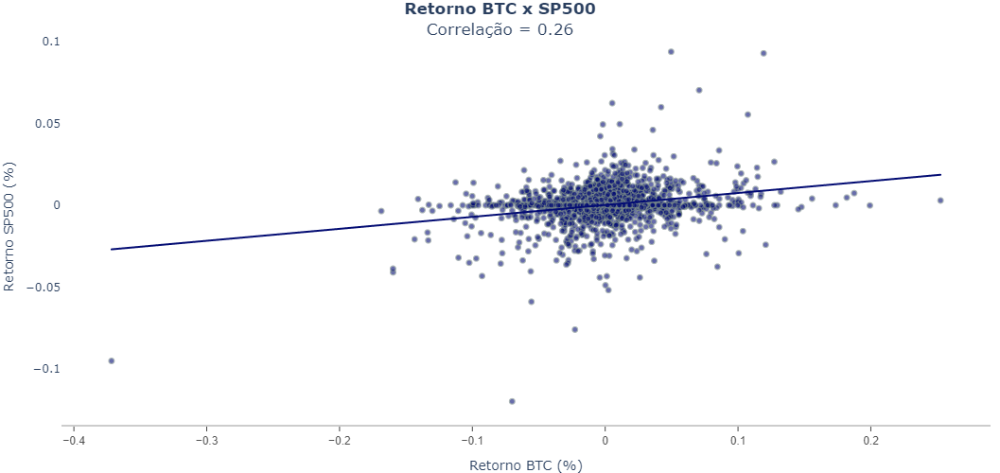

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.067
Model:                            OLS   Adj. R-squared:                  0.066
Method:                 Least Squares   F-statistic:                     130.3
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           3.35e-29
Time:                        18:07:56   Log-Likelihood:                 5651.0
No. Observations:                1826   AIC:                        -1.130e+04
Df Residuals:                    1824   BIC:                        -1.129e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      0.808      0.419      -0.000       0.001
x1             0.0730      0.006     11.415      0.000       0.060       0.086
==============================================================================
Omnibus:                      480.616   Durbin-Watson:                   2.043
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            20521.079
Skew:                          -0.452   Prob(JB):                         0.00
Kurtosis:                      19.398   Cond. No.                         24.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [52]:
fig, results = generate_trendline(df=df_trend, xvar='BTC', yvar='SP500', 
                                  trendtype='ols', color='#030C73', **plotly_kwargs)
fig.show()
results.iloc[0].summary()

A correlação entre os retornos de `BTC` e `SP500` é baixa, da mesma forma que entre `BTC` e `NDXT`.

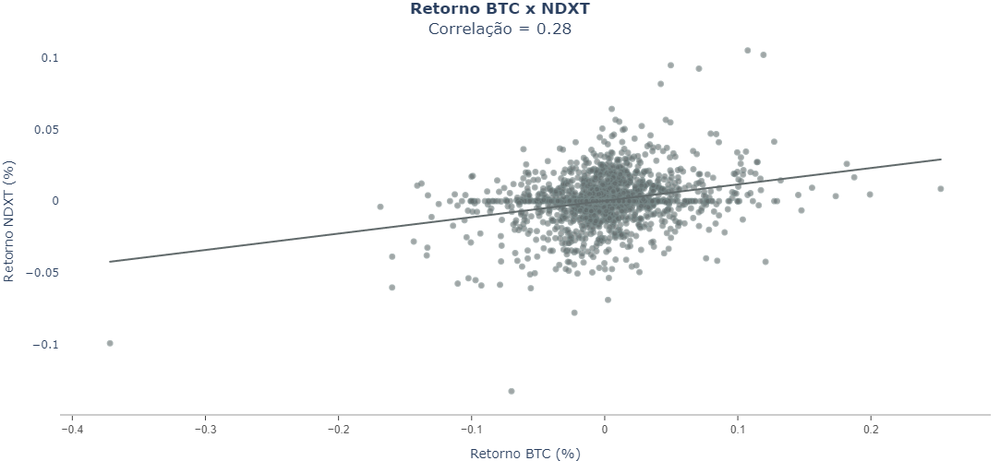

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     155.0
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           3.31e-34
Time:                        18:10:14   Log-Likelihood:                 4992.8
No. Observations:                1826   AIC:                            -9982.
Df Residuals:                    1824   BIC:                            -9971.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      0.592      0.554      -0.001       0.001
x1             0.1142      0.009     12.450      0.000       0.096       0.132
==============================================================================
Omnibus:                      246.019   Durbin-Watson:                   2.105
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2830.154
Skew:                          -0.133   Prob(JB):                         0.00
Kurtosis:                       9.093   Cond. No.                         24.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [53]:
fig, results = generate_trendline(df=df_trend, xvar='BTC', yvar='NDXT', 
                                  trendtype='ols', color='#616A6B', **plotly_kwargs)
fig.show()
results.iloc[0].summary()

Já a correlação entre os retornos de `SP500` e `NDXT` é alta, pois ambos tem comportamento similar.

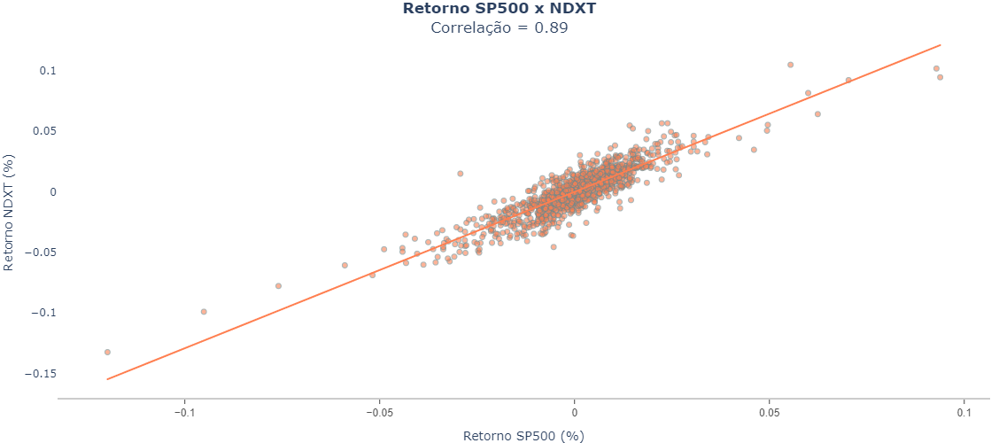

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     5233.
Date:                Fri, 18 Nov 2022   Prob (F-statistic):               0.00
Time:                        12:28:37   Log-Likelihood:                 4581.6
No. Observations:                1377   AIC:                            -9159.
Df Residuals:                    1375   BIC:                            -9149.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       7.049e-06      0.000      0.030      0.976      -0.000       0.000
x1             1.2919      0.018     72.342      0.000       1.257       1.327
==============================================================================
Omnibus:                       77.725   Durbin-Watson:                   1.945
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              297.284
Skew:                           0.046   Prob(JB):                     2.79e-65
Kurtosis:                       5.274   Cond. No.                         76.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [67]:
#@title Correlação SP500 x NDXT {display-mode: "form"}

fig, results = generate_trendline(df=df_trend, xvar='SP500', yvar='NDXT', 
                                  trendtype='ols', color='#FF7F50', **plotly_kwargs)
fig.show()
results.iloc[0].summary()

##### **Relação do Bitcoin com a stablecoin USD Tether**

*OBS.:* __Stablecoins__, também chamadas de moedas estáveis, são criptomoedas pareadas em algum ativo estável ou cesta de ativos, de modo a controlar a volatilidade.
As criptomoedas lastreadas em moedas fiduciárias são as mais comuns e foram o primeiro tipo de stablecoins no mercado. Seu valor está atrelado a uma ou mais moedas (o dólar americano, o euro e o franco suíço são os mais comuns) em uma proporção fixa.
<br>
No caso da __USD Tether__, ela acompanha o preço do dólar americano.

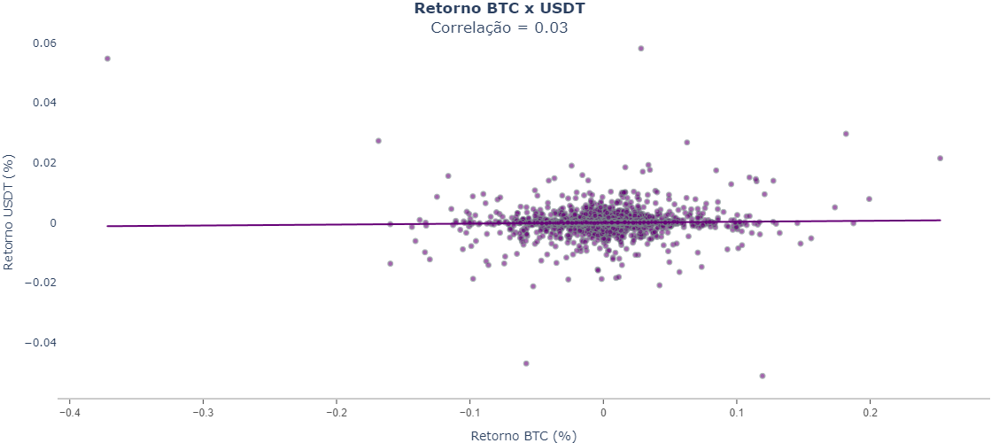

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.413
Date:                Sat, 19 Nov 2022   Prob (F-statistic):              0.235
Time:                        18:13:40   Log-Likelihood:                 7258.0
No. Observations:                1826   AIC:                        -1.451e+04
Df Residuals:                    1824   BIC:                        -1.450e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.319e-06      0.000      0.050      0.960      -0.000       0.000
x1             0.0032      0.003      1.189      0.235      -0.002       0.008
==============================================================================
Omnibus:                      853.300   Durbin-Watson:                   1.835
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           164944.674
Skew:                           1.057   Prob(JB):                         0.00
Kurtosis:                      49.513   Cond. No.                         24.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [55]:
df_trend = pd.concat([df['btc'].pct_change().dropna(), 
                      df['usdt'].pct_change().dropna()], axis=1)
df_trend.columns = ['BTC','USDT']
fig, results = generate_trendline(df=df_trend, xvar='BTC', yvar='USDT', 
                                  trendtype='ols', color='#660077', **plotly_kwargs)
fig.show()
results.iloc[0].summary()

Correlação do retorno baixa também entre USDT e BTC.

##### **Relação do Bitcoin com a Ethereum (ETH)**
O Ether é uma criptomoeda utilizada dentro da plataforma do Ethereum para rodar os contratos inteligentes, serviços computacionais dentro da rede e para pagar taxas aos mineradores. É uma das criptos mais negociadas, depois do Bitcoin.

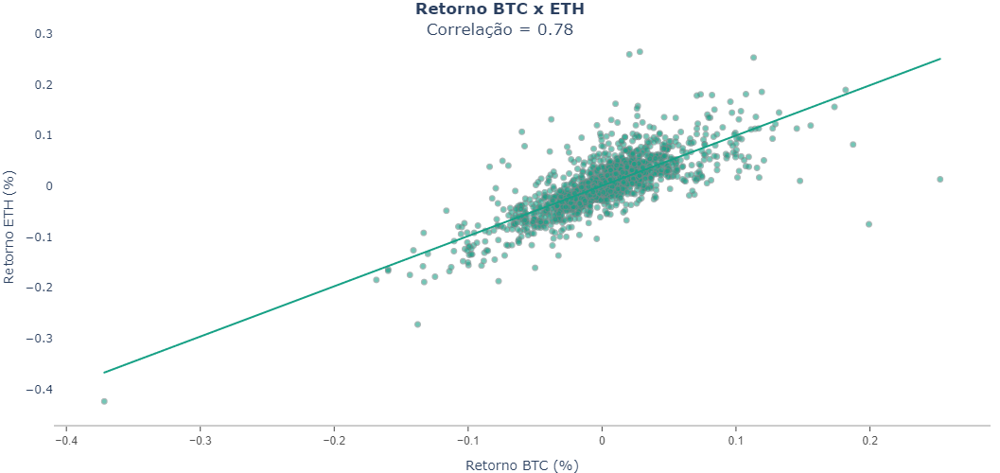

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     2766.
Date:                Sat, 19 Nov 2022   Prob (F-statistic):               0.00
Time:                        18:14:13   Log-Likelihood:                 3682.2
No. Observations:                1826   AIC:                            -7360.
Df Residuals:                    1824   BIC:                            -7349.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0008      0.001      1.071      0.284      -0.001       0.002
x1             0.9889      0.019     52.596      0.000       0.952       1.026
==============================================================================
Omnibus:                      397.332   Durbin-Watson:                   1.811
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7781.787
Skew:                           0.491   Prob(JB):                         0.00
Kurtosis:                      13.066   Cond. No.                         24.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [56]:
df_trend = pd.concat([df['btc'].pct_change().dropna(), 
                      df['eth'].pct_change().dropna()], axis=1)
df_trend.columns = ['BTC','ETH']
fig, results = generate_trendline(df=df_trend, xvar='BTC', yvar='ETH', 
                                  trendtype='ols', color='#16A085', **plotly_kwargs)
fig.show()
results.iloc[0].summary()

Já ambas as criptos se comportam de forma similar, então possuem alta correlação de retorno.

----------------

## 6. Simulações de retorno sobre o valor investido

In [87]:
#@title função utilizada {display-mode: "form"}
def calculate_return_percentage(starting_value, ending_value, period):
    """
    Calculates the return percentage over period.
    :param starting_value: The starting value.
    :param ending_value: The ending value.
    :param period: The period.
    :return: The annual return percentage.
    """
    if period <= 0:
        raise ValueError("Period must be greater than 0")

    return_value = (ending_value - starting_value) / starting_value
    return (1 + return_value) ** (1 / period) - 1

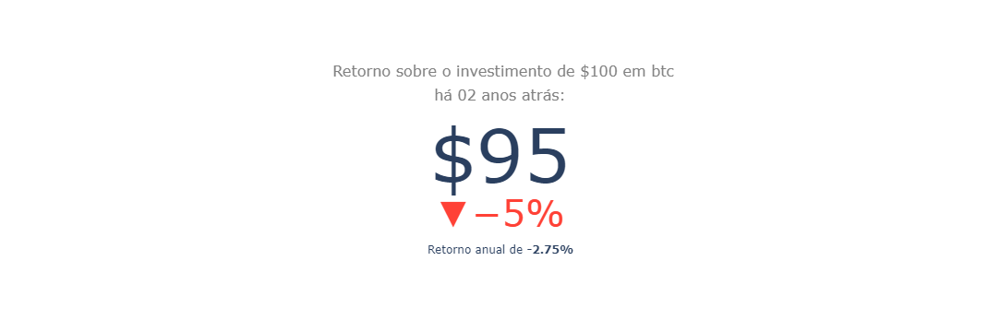

In [91]:
#@title se eu tivesse investido $100.00 há 02 anos atrás {display-mode: "form"}
last_date = df['btc'].last('D').index

invested_amount = 100
btc_price_today = df.loc[last_date, 'btc'].values[0]
dt_2years_ago = pd.to_datetime(pd.to_datetime(last_date.values[0]) - relativedelta(years=2), format='%Y-%m-%d')
btc_price_2year_ago = df.loc[dt_2years_ago,'btc']
invested_to_btc = invested_amount / btc_price_2year_ago
invested_amount_today = invested_to_btc * btc_price_today

return_of_investiment = calculate_return_percentage(invested_amount, invested_amount_today, 2)

fig = go.Figure(go.Indicator(
    mode = "number+delta",
    title = {"text": f" <span style='font-size:0.8em;color:gray'>Retorno sobre o investimento de ${invested_amount} em btc</span><br><span style='font-size:0.8em;color:gray'>há 02 anos atrás:</span>"},
    value = invested_amount_today,
    number = {'prefix': "$"},
    delta = {'position': "bottom", 'reference': invested_amount, 'relative': True},
    domain = {'x': [0, 1], 'y': [0, 1]}))
fig.update_traces(delta_valueformat=".0%", selector=dict(type='indicator'))
fig.update_traces(number_valueformat=",.0f", selector=dict(type='indicator'))
fig.add_annotation(text=f"Retorno anual de <b>{return_of_investiment*100:.2f}%</b>",
                  xref="paper", yref="paper",
                  x=0.5, y=0, showarrow=False)
fig.show()

In [94]:
# Rentabilidade anual
# 2017 fica distorcido pelo fato de não termos o ano completo
df['btc'].pct_change(freq='Y').dropna()

Date
2017-12-31    0.836350
2018-12-31   -0.735618
2019-12-31    0.922034
2020-12-31    3.031601
2021-12-31    0.596679
Name: btc, dtype: float64

In [82]:
%%capture
!pip install --upgrade pip
!pip install --upgrade pandas
!pip install --upgrade pandas-datareader
!pip install cmasher
!pip install pytrends